In [1]:
import pandas as pd
import os
os.chdir('/users/sgdbareh/volatile/ECHR_Importance')
from API_key import openai_key
from openai import OpenAI
client = OpenAI(api_key=openai_key)

In [11]:
from langchain.text_splitter import RecursiveCharacterTextSplitter
from langchain_community.document_loaders import DataFrameLoader
from langchain_text_splitters import RecursiveCharacterTextSplitter
from langchain.embeddings import OpenAIEmbeddings # Importing OpenAI embeddings from Langchain
from langchain.vectorstores.chroma import Chroma # Importing Chroma vector store from Langchain
import shutil # Importing shutil module for high-level file operations
from langchain_community.embeddings import HuggingFaceEmbeddings

To do:

- Metadata filtering

- finetuning?
- refine/ map rerank for reducing document amount (rerank earlier)
- CaseGPT - ranking mechanism - incorporate metadata i.e. case recency, citation frequency, jurisdictional relevance; Try MMR - helps with diversity 

- Embedding Models -
-- BM25
-- BERT
-- Legal BERT
-- OpenAI
-- Hybrid
-- LLMEncoder?

- Try truncation, summarisation, averaging, chunking

- Chunking -
-- 

In [6]:
comm = pd.read_pickle('Art_3_Data_Process/comm_cases.pkl')

In [9]:
len(comm)

1379

In [8]:
comm['Subj_Count'].median()

896.0

#### Split/ Chunk Docs

In [3]:
text = pd.read_pickle('/users/sgdbareh/volatile/ECHR_Importance/Art_3_Data_Process/outcome_cases.pkl')

In [4]:
text['Facts'] = text['Facts'].str.replace('\n', ' ')

In [5]:
# load documents
loader = DataFrameLoader(text,page_content_column='Facts')

In [6]:
documents = loader.load()

In [7]:
documents[0].metadata

{'Word Count': 272,
 'The Law': '1. The applicant complains under Article 5 paras. 1, 3 and 5(Art. 5-1, 5-3, 5-5) of the Convention that he was unjustly held indetention and that he was not granted sufficient compensation.Insofar as the applicant complains under Article 5 paras. 1 and3 (Art. 5-1, 5-3) of the Convention, the Commission notes that theapplicant was detained until November 1986 when he was acquitted by theAnkara Martial Law Court.However, Turkey has only recognised the competence of theCommission to examine individual applications concerning facts whichoccurred after 28 January 1987.As the applicant\'s complaints relate to events occurring before28 January 1987, this part of the application is outside the competenceof the Commission ratione temporis and must accordingly be rejected asbeing incompatible with the provisions of the Convention, within themeaning of Article 27 para. 2 (Art. 27-2) of the Convention.2. As regards the applicant\'s complaint under Article 5 para. 5

In [75]:
text_splitter = RecursiveCharacterTextSplitter.from_tiktoken_encoder(model_name='gpt-4o',chunk_size=1024,chunk_overlap=256)

In [11]:
# Split documents into smaller chunks using text splitter
chunks = text_splitter.split_documents(documents)
print(f"Split {len(documents)} documents into {len(chunks)} chunks.")


Split 7654 documents into 30515 chunks.


In [12]:
# Print example of page content and metadata for a chunk
document = chunks[2]
print(document.page_content)
print(document.metadata)

makes provision for the Parole Board (known in this context, as the Discretionary Life Panel) to have power to direct the Secretary of State to release discretionary life prisoners. Subsection (4) states :" The Board shall not give a direction under subsection (3) above with respect to a discretionary life prisoner unless...(a) the Secretary of State has referred the prisoner's case to the Board; and(b) the Board is satisfied that it is no longer necessary for the protection of the public that the prisoner should be confined."COMPLAINTSThe applicant alleges a breach of Article 5 § 4 of the Convention as he claims that his continued detention is unlawful. He states that he no longer poses a threat to the public, that his tariff is in effect being unlawfully extended by the DLP, that the DLP is not impartial, that there is no right of appeal, that the review process is too slow and that the burden of proof wrongly falls on the prisoner to show that he is not a danger to the public. The a

In [13]:
total = 0
for i in range(len(chunks)):
    total += len(chunks[i].page_content)
total

130395148

In [14]:
130_395_148/1_000_000 * 0.130

16.951369240000002

In [11]:
embed_model = HuggingFaceEmbeddings(model_name="all-MiniLM-L6-v2"),
embedding_model = HuggingFaceEmbeddings(
    model_name="all-MiniLM-L6-v2",
    multi_process=True,
    model_kwargs={"device": "cuda"},
    encode_kwargs={"normalize_embeddings": True},  # Set `True` for cosine similarity
)

/users/sgdbareh/volatile/miniconda3/envs/ECHR/lib/python3.11/site-packages/langchain_core/_api/deprecation.py:139: LangChainDeprecationWarning: The class `HuggingFaceEmbeddings` was deprecated in LangChain 0.2.2 and will be removed in 0.3.0. An updated version of the class exists in the langchain-huggingface package and should be used instead. To use it run `pip install -U langchain-huggingface` and import as `from langchain_huggingface import HuggingFaceEmbeddings`.
  warn_deprecated(
/users/sgdbareh/volatile/miniconda3/envs/ECHR/lib/python3.11/site-packages/sentence_transformers/cross_encoder/CrossEncoder.py:11: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm, trange
/users/sgdbareh/volatile/miniconda3/envs/ECHR/lib/python3.11/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set 

In [178]:
embedding_model_2 = HuggingFaceEmbeddings(
    model_name="nlpaueb/legal-bert-base-uncased",
    multi_process=True,
    #model_kwargs={"device": "cuda"},
    encode_kwargs={"normalize_embeddings": True},  # Set `True` for cosine similarity
)

No sentence-transformers model found with name nlpaueb/legal-bert-base-uncased. Creating a new one with mean pooling.
/users/sgdbareh/volatile/miniconda3/envs/ECHR/lib/python3.11/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [115]:
from transformers import AutoTokenizer, AutoModel

tokenizer = AutoTokenizer.from_pretrained("nlpaueb/legal-bert-base-uncased")
model = AutoModel.from_pretrained("nlpaueb/legal-bert-base-uncased")

/users/sgdbareh/volatile/miniconda3/envs/ECHR/lib/python3.11/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [124]:
import torch 
def embed_text(text,mean=True):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True)
    with torch.no_grad():
        outputs = model(**inputs)
    if mean:
        return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()
    else:
        return outputs.last_hidden_state[:,0].squeeze().numpy()

In [118]:
test_text = "Once in a vibrant orchard nestled between gentle hills, a small peach named Pippin hung from a sturdy branch of the oldest tree. Pippin was a plump, fuzzy little fruit with a blush of pink and a golden hue, but he often felt overlooked amidst the larger, more luscious peaches thriving around him. As summer waned and the days grew shorter, an anxious feeling settled in Pippin’s core; what if he was never picked? What if everyone forgot about him? One sunny morning, a fluttering butterfly named Bella landed nearby. Seeing Pippin\'s worried expression, she asked, “Why do you look so glum, little peach?” With a sigh, Pippin confessed his fears of never being chosen, of just swinging in the breeze while the bigger ones basked in glory and attention. Bella thought for a moment and said, “But your size could be your greatest strength! Small things often carry unique sweetness.” Encouraged by her words, Pippin decided to focus on the things he could do. He began to gently sway with the wind, creating a delightful rhythm that caught the attention of nearby critters. The squirrels chimed in with their chatter, and the birds added melodic tweets, creating a symphony beneath the canopy. Slowly, the other fruits began to notice the joyful energy radiating from the little peach. As the days passed, Pippin formed friendships with the creatures that frequented the orchard. A wise old sparrow named Sage, who shared stories of adventures and wisdom, often perched beside him, while a family of rabbits would nibble clover nearby, enjoying Pippin’s daily tales about the world beyond the orchard. It became clear to Pippin that he brought joy to others, and that mattered more than being the biggest peach on the tree. One particularly sunny day, the orchard buzzed with excitement; it was harvest time! Farmers and families trekked into the orchard, laughing and shouting, ready to pick the ripest fruits. Pippin felt his heart race, knowing this could be his moment of truth. The larger peaches were quickly plucked, and his friends called out to him, “Don’t worry, Pippin! We’ll make sure you’re noticed!” When it was finally his turn, a young girl named Mia reached up to Pippin with eager hands. Her gaze lingered on him, and in that moment of connection, he felt a rush of joy. “Look at this little peach!” she exclaimed, “He’s so cute!” With a gentle tug, she picked Pippin and placed him into her basket, nestled between other fruits. Being chosen filled Pippin with pride, but he was also a bit nervous about what awaited him beyond the orchard. Little did he know, his adventure was just beginning. Mia’s family took him home, where he was placed on a kitchen counter, surrounded by ripe fruit and the aroma of home-cooked meals. Pippin was introduced to an array of fragrant spices, vibrant herbs, and the warmth of family gatherings. As evening approached, Mia’s parents announced that they were making a special dessert. Pippin’s heart skipped; he wasn’t just going to be eaten, he was going to be part of something magical! When they sliced him open, his sweet fragrance wafted through the air, mingling with the rich notes of cinnamon and vanilla. Pippin felt proud to be transformed into a delicious peach cobbler that would bring smiles to everyone who tasted it.That night, as the family gathered around the table, laughter and stories filled the room. They savored each bite, finding delight in the sweetness of Pippin’s flavor, combined with the warmth of the buttery crust. Flashes of joy jumped from one face to another, illuminating the small kitchen with happiness. Even in their reactions, Pippin felt his worth being fulfilled—he was no longer just a small peach, he had become a vessel of love and memories. Once the dessert was finished, the table was alive with conversations, reminiscing about summer joys and the sweetness of peaches. Pippin knew he’d achieved something great; he had brought his own joy to the world, proving that even the smallest things could create a lasting impact. He\'d become part of something larger, cherished and savored. As he faded into sweet memories, Pippin realized that life wasn’t about being the biggest or the brightest; it was about connection and the warmth shared between friends and family. In those moments, he had fulfilled his purpose—and in doing so, taught everyone a valuable lesson about appreciating the simple joys of life. From that day forward, Pippin was not just a small peach in a vast orchard; he was a beloved reminder that every little thing can hold immense value, and that sometimes, being small is the greatest adventure of all.\'"

In [119]:
len(test_text)

4624

In [120]:
test_embed = embed_text(test_text)

In [125]:
test_embed_2 = embed_text(test_text,mean=False)

In [127]:
test_embed

array([-1.09985545e-01, -6.64619505e-02,  2.77640879e-01,  9.67695192e-02,
        2.45494217e-01, -7.46046603e-02,  2.96567082e-01,  3.88658285e-01,
       -3.13849807e-01, -2.14588419e-02,  1.53759301e-01,  2.16038506e-02,
       -3.12198661e-02,  1.82016581e-01, -2.84487784e-01,  7.34382123e-02,
        4.02613789e-01, -1.62496388e-01, -2.59501003e-02, -1.71376020e-01,
        1.40000358e-01,  3.74043621e-02,  9.08111334e-02,  4.46654141e-01,
        2.20223486e-01,  2.47991353e-01, -2.06037000e-01, -3.57972205e-01,
       -9.07076001e-02,  1.79804824e-02,  8.14277083e-02,  3.85182798e-02,
        7.33376667e-02, -4.56362665e-01, -8.64251107e-02, -4.96986462e-03,
       -5.31993806e-02, -7.37932324e-02,  2.78133988e-01,  2.90497363e-01,
       -1.33044884e-01, -2.21240118e-01,  1.02385834e-01,  1.43513232e-01,
       -3.36016357e-01, -1.86138183e-01, -1.87319160e-01,  1.41194552e-01,
        7.36872852e-02, -9.18158889e-02, -3.56594175e-01,  3.38369071e-01,
        1.60375714e-01, -

In [128]:
test_embed_2

array([-3.39391865e-02, -2.78940856e-01, -2.62386739e-01,  1.74149737e-01,
        7.85841107e-01,  1.41275287e-01,  8.70530605e-01,  3.81606728e-01,
       -4.50351834e-01, -6.62186816e-02, -3.56315941e-01,  2.61504620e-01,
        7.73144215e-02,  6.85530782e-01, -3.61089438e-01, -1.45956039e-01,
        6.64911568e-01, -5.59882283e-01, -1.50135802e-02, -1.88968524e-01,
        4.70311232e-02,  1.20457642e-01,  4.39346522e-01,  4.62666117e-02,
        6.05402529e-01,  2.72653639e-01, -6.39944792e-01, -5.64387858e-01,
       -1.91045240e-01,  2.53303587e-01, -1.56797603e-01,  5.52975655e-01,
        2.23575205e-01, -3.63173097e-01,  3.08361530e-01, -1.67547092e-01,
        1.85700476e-01,  1.59441620e-01,  1.78147063e-01,  2.99283803e-01,
       -2.31455401e-01,  1.95267558e-01,  7.08263695e-01,  4.62525725e-01,
       -7.73025692e-01, -3.13849014e-04, -5.71839905e+00,  4.26050186e-01,
       -1.21005652e-02, -9.29780960e-01,  8.46823379e-02,  3.02378029e-01,
        1.90982476e-01,  

In [25]:
import faiss
from langchain_community.docstore.in_memory import InMemoryDocstore
from langchain_community.vectorstores import FAISS
from langchain_community.vectorstores.utils import DistanceStrategy


In [130]:
chunks[0].metadata

{'Word Count': 272,
 'The Law': '1. The applicant complains under Article 5 paras. 1, 3 and 5(Art. 5-1, 5-3, 5-5) of the Convention that he was unjustly held indetention and that he was not granted sufficient compensation.Insofar as the applicant complains under Article 5 paras. 1 and3 (Art. 5-1, 5-3) of the Convention, the Commission notes that theapplicant was detained until November 1986 when he was acquitted by theAnkara Martial Law Court.However, Turkey has only recognised the competence of theCommission to examine individual applications concerning facts whichoccurred after 28 January 1987.As the applicant\'s complaints relate to events occurring before28 January 1987, this part of the application is outside the competenceof the Commission ratione temporis and must accordingly be rejected asbeing incompatible with the provisions of the Convention, within themeaning of Article 27 para. 2 (Art. 27-2) of the Convention.2. As regards the applicant\'s complaint under Article 5 para. 5

In [91]:
db = FAISS.from_documents(chunks,
                          embedding=embedding_model,
                          distance_strategy=DistanceStrategy.COSINE)


In [93]:
user_query = "Article 6 concerns the prohibition of torture"
query_vector = embedding_model.embed_query(user_query)

In [13]:
from datetime import datetime

# Define the start date for filtering
start_date = datetime(2020, 1, 1)

# Define the filter function
def date_filter(doc, start_date):
    #print(doc)
    doc_date = doc['date']
    return doc_date < start_date

# Perform similarity search with the date filter

#retrieved_docs = db.similarity_search_with_relevance_scores(
#    user_query,
#    k=10,
#    filter=date_filter
#)


In [151]:
# Print the retrieved documents
for doc, score in retrieved_docs:
    print('Begin')
    print(f"Document: {doc.page_content}, Date: {doc.metadata['date']}, Score: {score}")


Begin
Document: a press conference held after her release ...92. An international juridical regime of absolute prohibition of all forms of torture, both physical and psychological, has been developed and, with regard to the latter, it has been recognised that the threat or real danger of subjecting a person to physical harm produces, under determined circumstances, such a degree of moral anguish that it may be considered ‘psychological torture’. ......98. In light of the foregoing, the court declares that the State violated Article 5 of the American Convention [on Human Rights], in relation to Article 1 § 1 thereof, and the obligations established in Articles 1 and 6 of the Inter-American Convention against Torture, to the detriment of Maritza Urrutia.”67. The United Nations Special Rapporteur for the Commission on Human Rights found in his report of 3 July 2001 to the General Assembly on the question of torture and other cruel, inhuman or degrading treatment or punishment (UN Doc. A/5

In [148]:
retrieved_docs = db.similarity_search_with_relevance_scores(user_query, k=10)

In [149]:
for doc, score in retrieved_docs:
    print('Begin')
    print(f"Document: {doc.page_content}, Date: {doc.metadata['date']}, Score: {score}")


Begin
Document: amended in 2014, prohibit and punish specific acts that could be considered as torture. However, it remains concerned that those provisions do not include all the elements of the definition of torture set out in article 1 of the Convention. In particular:(a) While noting the provisions established to prohibit the extraction of confessions under torture or the use of violence to obtain a witness statement (article 247 of the Criminal Law), the Committee is concerned that the prohibition may not cover all public officials and persons acting in an official capacity. Moreover, the provisions do not address the use of torture for purposes other than extracting confessions from defendants or criminal suspects;(b) The crime of beating or ill-treating detainees, contained in article 248 of the Criminal Law, restricts the scope of the crime to the actions of officers of an institution of confinement or of other detainees at the instigation of those officers. It is also restricte

In [116]:
for res in retrieved_docs:
    print(f"*{res.page_content} [{res.metadata}]")

*amended in 2014, prohibit and punish specific acts that could be considered as torture. However, it remains concerned that those provisions do not include all the elements of the definition of torture set out in article 1 of the Convention. In particular:(a) While noting the provisions established to prohibit the extraction of confessions under torture or the use of violence to obtain a witness statement (article 247 of the Criminal Law), the Committee is concerned that the prohibition may not cover all public officials and persons acting in an official capacity. Moreover, the provisions do not address the use of torture for purposes other than extracting confessions from defendants or criminal suspects;(b) The crime of beating or ill-treating detainees, contained in article 248 of the Criminal Law, restricts the scope of the crime to the actions of officers of an institution of confinement or of other detainees at the instigation of those officers. It is also restricted to the inflic

In [109]:
retriever = db.as_retriever(
    search_type="mmr", search_kwargs={"k": 5, "fetch_k": 10}
)
test = retriever.invoke(user_query)

In [112]:
test

[Document(metadata={'Word Count': 6310, 'The Law': 'ALLEGED VIOLATION OF ARTICLE 3 OF THE CONVENTION45. The applicant complained that his extradition to China, if carried out, would be in breach of the prohibition of torture and inhuman and degrading treatment. He relied on Article 3 of the Convention, which reads:“No one shall be subjected to torture or to inhuman or degrading treatment or punishment.”AdmissibilityThe parties’ submissionsThe parties’ submissionsThe parties’ submissionsThe parties’ submissions46. The Government submitted that the applicant’s complaint under Article 3 of the Convention was premature, as the case concerning the legality of the applicant’s extradition to China was pending before the Supreme Court (see paragraph 15 above) and no decision concerning extradition had been taken by the Minister of Justice (see paragraph 31 above).47. The applicant argued that he had exhausted all domestic remedies concerning the extradition proceedings, including a request to 

In [62]:
parent_splitter = RecursiveCharacterTextSplitter.from_tiktoken_encoder(model_name='gpt-4o',chunk_size=5000,chunk_overlap=256)
child_splitter = RecursiveCharacterTextSplitter.from_tiktoken_encoder(model_name='gpt-4o',chunk_size=1024,chunk_overlap=128)

In [14]:
user_query = "Article 6 concerns the prohibition of torture"


In [60]:
from langchain.storage import InMemoryStore
index = faiss.IndexFlatL2(len(embedding_model.embed_query("hello world")))

vector_store = FAISS(
    embedding_function=embedding_model,
    index=index,
    docstore=InMemoryDocstore(),
    index_to_docstore_id={},
    distance_strategy=DistanceStrategy.COSINE,
)
store = InMemoryStore()

In [63]:
from langchain.retrievers import ParentDocumentRetriever
retriever_new = ParentDocumentRetriever(vectorstore=vector_store,docstore=store,child_splitter=child_splitter)

In [64]:
retriever_new.add_documents(documents)

In [23]:
import pickle

In [26]:
#save the retriever to disk
faiss.write_index(vector_store.index, "faiss_index_1.bin")

# Save document store and metadata
with open("docstore_1.pkl", "wb") as f:
    pickle.dump(vector_store.docstore, f)
with open("index_to_docstore_id_1.pkl", "wb") as f:
    pickle.dump(vector_store.index_to_docstore_id, f)

NameError: name 'vector_store' is not defined

### START HERE

In [3]:
from datetime import datetime
import pandas as pd
import os
os.chdir('/users/sgdbareh/volatile/ECHR_Importance')
from API_key import openai_key
from openai import OpenAI
client = OpenAI(api_key=openai_key)
import torch 
import faiss
import pickle
from langchain_community.docstore.in_memory import InMemoryDocstore
from langchain_community.vectorstores import FAISS
from langchain_community.vectorstores.utils import DistanceStrategy
from transformers import AutoTokenizer, AutoModel
from langchain.text_splitter import RecursiveCharacterTextSplitter
from langchain_community.document_loaders import DataFrameLoader
from langchain_text_splitters import RecursiveCharacterTextSplitter
from langchain_community.embeddings import OpenAIEmbeddings
from langchain_community.embeddings import HuggingFaceEmbeddings
from langchain.storage import InMemoryStore
from langchain.retrievers import ParentDocumentRetriever
from langchain_huggingface import HuggingFaceEmbeddings
from transformers import AutoModel, AutoTokenizer
from sentence_transformers import SentenceTransformer, models

REAL_K = 5

results_dict = {}

/users/sgdbareh/volatile/miniconda3/envs/ECHR/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [31]:
comm_cases = pd.read_pickle('/users/sgdbareh/volatile/ECHR_Importance/Art_3_Data_Process/comm_cases_valid.pkl')

# Load FAISS index
index = faiss.read_index("/users/sgdbareh/volatile/ECHR_Importance/VectorDB/faiss_index_chunk_512_embedding_bert_raw.bin")

# Load document store and metadata
with open("/users/sgdbareh/volatile/ECHR_Importance/VectorDB/docstore_chunk_512_embedding_bert_raw.pkl", "rb") as f:
    docstore = pickle.load(f)
with open("/users/sgdbareh/volatile/ECHR_Importance/VectorDB/index_to_docstore_id_chunk_512_embedding_bert_raw.pkl", "rb") as f:
    index_to_docstore_id = pickle.load(f)

embedding_name = "google-bert/bert-base-uncased"
setup = 'raw'
short_name = 'bert' 
chunk_size = 512
chunk_overlap = 50

# Load the LegalBert model and tokenizer
model = AutoModel.from_pretrained(embedding_name)
tokenizer = AutoTokenizer.from_pretrained(embedding_name)
text_splitter = RecursiveCharacterTextSplitter.from_huggingface_tokenizer(tokenizer,chunk_size=chunk_size,chunk_overlap=chunk_overlap)

# Create a SentenceTransformers model
word_embedding_model = models.Transformer(embedding_name)
pooling_model = models.Pooling(word_embedding_model.get_word_embedding_dimension())
sentence_transformer_model = SentenceTransformer(modules=[word_embedding_model, pooling_model])

# Save the model
sentence_transformer_model.save('bert-sentence-transformer')

print('embedding_name:', embedding_name, 'chunk_size:', chunk_size, 'chunk_overlap:', chunk_overlap)

embeddings = HuggingFaceEmbeddings(
model_name="bert-sentence-transformer",
multi_process=True,
model_kwargs={"device": "cuda"},
encode_kwargs={"normalize_embeddings": True}  # Set `True` for cosine similarity
)

vector_store_NEW = FAISS(
    embedding_function=embeddings,
    index=index,
    docstore=docstore,
    index_to_docstore_id=index_to_docstore_id,
    distance_strategy=DistanceStrategy.COSINE,
)

    

A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Pl

embedding_name: google-bert/bert-base-uncased chunk_size: 512 chunk_overlap: 50


In [41]:
test_case = comm_cases.iloc[2]

In [43]:
user_query = test_case['Subject Matter']

In [46]:
keywords = test_case['keywords_art_3']

In [70]:
keywords = ['350']

In [78]:
vector_results = vector_store_NEW.similarity_search_with_relevance_scores(user_query, k=5,filter={'kpthesaurus':{'$in':keywords}})

In [79]:
vector_results#[1][0].metadata['kpthesaurus']

[]

In [64]:
if '90' in '350;90;596;448;220': print('yes')

yes


In [ ]:
print('here')
    comm_cases.apply(lambda x: filter_new(x,vector_store_NEW.similarity_search(x['Subject Matter'], REAL_K*2)),axis=1)

    print(results_dict)
    pd.to_pickle(results_dict,'/users/sgdbareh/volatile/ECHR_Importance/VectorDB/results_dict_TEST.pkl')

### end here

In [27]:
# Load FAISS index
index = faiss.read_index("/users/sgdbareh/volatile/ECHR_Importance/faiss_index_1.bin")

# Load document store and metadata
with open("/users/sgdbareh/volatile/ECHR_Importance/docstore_1.pkl", "rb") as f:
    docstore = pickle.load(f)
with open("/users/sgdbareh/volatile/ECHR_Importance/index_to_docstore_id_1.pkl", "rb") as f:
    index_to_docstore_id = pickle.load(f)

In [28]:
from langchain.vectorstores import FAISS

vector_store_NEW = FAISS(
    embedding_function=embedding_model,
    index=index,
    docstore=docstore,
    index_to_docstore_id=index_to_docstore_id,
    distance_strategy=DistanceStrategy.COSINE,
)

NameError: name 'embedding_model' is not defined

In [140]:
NEW_store = InMemoryStore()

In [167]:
retriever_NEW_2 = ParentDocumentRetriever(vectorstore=vector_store_NEW, child_splitter=child_splitter, docstore=docstore)

In [173]:
newset_QUERY = vector_store_NEW.similarity_search_with_relevance_scores(user_query, k=10)

In [174]:
newset_QUERY

[(Document(metadata={'Word Count': 15038, 'The Law': 'I. THE COURT’S ASSESSMENT OF THE FACTS38. The Court recalls its constant case-law that under the Convention system the establishment and verification of the facts is primarily a matter for the Commission (Articles 28 para. 1 and 31) (art. 28-1, art. 31). While the Court is not bound by the Commission’s findings of fact and remains free to make its own appreciation in the light of all the material before it, it is only in exceptional circumstances that it will exercise its powers in this area (see the Akdivar and Others v. Turkey judgment of 16 September 1996, Reports of Judgments and Decisions 1996-IV, p. 1214, para. 78).39. In the instant case, it must be recalled that the Commission reached its findings of fact after a delegation had heard evidence in Turkey on two separate occasions, in addition to hearings in Strasbourg (see paragraph 23 above). In these circumstances, the Court considers that it should accept the facts as estab

In [ ]:
new_long = vector_store.similarity_search_with_relevance_scores(user_query,k=10,filter=date_filter)

In [175]:
new_long

[(Document(metadata={'Word Count': 15038, 'The Law': 'I. THE COURT’S ASSESSMENT OF THE FACTS38. The Court recalls its constant case-law that under the Convention system the establishment and verification of the facts is primarily a matter for the Commission (Articles 28 para. 1 and 31) (art. 28-1, art. 31). While the Court is not bound by the Commission’s findings of fact and remains free to make its own appreciation in the light of all the material before it, it is only in exceptional circumstances that it will exercise its powers in this area (see the Akdivar and Others v. Turkey judgment of 16 September 1996, Reports of Judgments and Decisions 1996-IV, p. 1214, para. 78).39. In the instant case, it must be recalled that the Commission reached its findings of fact after a delegation had heard evidence in Turkey on two separate occasions, in addition to hearings in Strasbourg (see paragraph 23 above). In these circumstances, the Court considers that it should accept the facts as estab

In [72]:
len(new_long[2].page_content)

5211

In [ ]:
new_list = newset_QUERY[:5]

In [148]:
keys = [doc[0].metadata["doc_id"] for doc in new_list]

In [149]:
keys

['5a13473f-77ce-4114-89d5-c2f13aa4a72f',
 'cff082fe-4a7b-44c2-a559-ce52d0aad141',
 'c28d0e92-fc75-4a0f-8328-4d21abcecb8f',
 'c417b903-2b36-48e2-b8fd-e185d3db1282',
 '3f338950-5d9d-48a1-823a-c331b0be6c07']

In [152]:
documents = store.mget(keys)

In [154]:
documents = docstore.mget(keys)

AttributeError: 'InMemoryDocstore' object has no attribute 'mget'

In [153]:
documents

[Document(metadata={'Word Count': 15038, 'The Law': 'I. THE COURT’S ASSESSMENT OF THE FACTS38. The Court recalls its constant case-law that under the Convention system the establishment and verification of the facts is primarily a matter for the Commission (Articles 28 para. 1 and 31) (art. 28-1, art. 31). While the Court is not bound by the Commission’s findings of fact and remains free to make its own appreciation in the light of all the material before it, it is only in exceptional circumstances that it will exercise its powers in this area (see the Akdivar and Others v. Turkey judgment of 16 September 1996, Reports of Judgments and Decisions 1996-IV, p. 1214, para. 78).39. In the instant case, it must be recalled that the Commission reached its findings of fact after a delegation had heard evidence in Turkey on two separate occasions, in addition to hearings in Strasbourg (see paragraph 23 above). In these circumstances, the Court considers that it should accept the facts as establ

In [95]:
for i in new_list:
    print(i[0].metadata['date'])

1996-12-18 00:00:00
2010-06-01 00:00:00
2006-07-11 00:00:00
2017-01-26 00:00:00
2015-11-03 00:00:00


In [77]:
len(new_long[0].page_content)

4965

In [ ]:
#UNIQUE DOCUMENTS RETRIEVED!!!!!

#Also make parent retriever retrieve k docs; 
# ^ also use filter with parent retriever

In [19]:
vector_store.similarity_search_with_relevance_scores(user_query, k=10)

[(Document(metadata={'Word Count': 15038, 'The Law': 'I. THE COURT’S ASSESSMENT OF THE FACTS38. The Court recalls its constant case-law that under the Convention system the establishment and verification of the facts is primarily a matter for the Commission (Articles 28 para. 1 and 31) (art. 28-1, art. 31). While the Court is not bound by the Commission’s findings of fact and remains free to make its own appreciation in the light of all the material before it, it is only in exceptional circumstances that it will exercise its powers in this area (see the Akdivar and Others v. Turkey judgment of 16 September 1996, Reports of Judgments and Decisions 1996-IV, p. 1214, para. 78).39. In the instant case, it must be recalled that the Commission reached its findings of fact after a delegation had heard evidence in Turkey on two separate occasions, in addition to hearings in Strasbourg (see paragraph 23 above). In these circumstances, the Court considers that it should accept the facts as estab

### Neo4J

In [ ]:
from langchain.graphs import Neo4jGraph

url = "neo4j+s://databases.neo4j.io"
username ="neo4j"
password = ""
graph = Neo4jGraph(
   url=url,
   username=username,
   password=password
)

### Metadata processing

In [1]:
import pandas as pd

In [2]:
results = pd.read_pickle('/users/sgdbareh/volatile/ECHR_Importance/VectorDB/results_dict_TEST.pkl')

In [8]:
data_old = pd.read_pickle('/users/sgdbareh/volatile/ECHR_Importance/Art_3_Data_Process/comm_cases_with_metadata.pkl')

In [46]:
data = pd.read_pickle('/users/sgdbareh/volatile/ECHR_Importance/Art_3_Data_Process/comm_cases_with_metadata_UPDATE.pkl')

In [4]:
data.columns

Index(['Filename', 'Questions', 'Subject Matter', 'appno', 'source_file',
       'doc_date', 'importance', 'keywords_art_3', 'keywords_art_3_text',
       'Subj_Count', 'extractedappno', 'extractedappno_list',
       'extractedapplen'],
      dtype='object')

In [47]:
data[['appno','extractedappno','extractedappno_list']]

,appno,extractedappno,extractedappno_list
0,72861/11,72861/11;30696/09;57264/09,"[30696/09, 57264/09]"
1,56074/10,56074/10;18919/10;25803/94;26973/95;77617/01;4...,"[18919/10, 25803/94, 26973/95, 77617/01, 42066..."
2,75972/11,75972/11,[]
3,46108/11,46108/11;61767/08;26772/95;7842/04;2346/02;302...,"[61767/08, 26772/95, 7842/04, 2346/02, 30210/9..."
4,44885/06,44885/06;1750/03;34636/09;13074/07;29462/95;21...,"[1750/03, 34636/09, 13074/07, 29462/95, 21566/..."
...,...,...,...
1369,54009/21,54009/21,[]
1370,34039/22,34039/22,[]
1371,26597/23,26597/23,[]
1372,22144/23,22144/23,[]


In [48]:
#checking scl app nos

data[data['extractedappno_list'].apply(lambda x: '14097/12' in x)].iloc[0]#['sclappno']

#14097/12;45135/12;73712/12;34001/13;44055/13;64586/13

Filename                                                      001-127971
Questions              1. Have the conditions of the applicant’s dete...
Subject Matter         The applicant, Mr Kristijan Muršić, is a Croat...
appno                                                            7334/13
source_file                                pruned_GRANDCHAMBER_meta.json
doc_date                                                      2016-10-20
importance                                                             1
keywords_art_3                                                 [350, 90]
keywords_art_3_text    (Art. 3) Prohibition of torture, (Art. 3) Degr...
Subj_Count                                                           424
extractedappno         7334/13;22635/03;43517/09;46882/09;55400/09;57...
extractedappno_list    [22635/03, 43517/09, 46882/09, 55400/09, 57875...
extractedapplen                                                      207
Name: 440, dtype: object

In [49]:
#load metadata
metadata = pd.read_pickle('/users/sgdbareh/volatile/ECHR_Importance/Art_3_Data_Process/unfiltered_metadata.pkl')

In [50]:
#create list of appnos assigned to case
metadata['appno_list'] = metadata['appno'].apply(lambda x: x.split(';'))

In [51]:
#check
metadata[metadata['appno_list'].apply(lambda x: '45135/12' in x)]

,itemid,appno,doctypebranch,respondent,decisiondate,extractedappno,conclusion,importance,kpthesaurus,judgementdate,...,appnoparts,scl,advopstatus,docname,rulesofcourt,documentcollectionid,ecli,sclappnos,rank,appno_list
29220,001-152784,14097/12;45135/12;73712/12;34001/13;44055/13;6...,CHAMBER,HUN,,14097/12;45135/12;73712/12;34001/13;44055/13;6...,Preliminary objection joined to merits and dis...,2,350;90;444;110;14;128;216;577;283;26;638;636;637,10/03/2015 00:00:00,...,14097;12;45135;12;73712;12;34001;13;44055;13;6...,"Akdivar and Others v. Turkey, 16 September 199...",,CASE OF VARGA AND OTHERS v. HUNGARY,17,CASELAW;JUDGMENTS;CHAMBER;ENG,ECLI:CE:ECHR:2015:0310JUD001409712,46468/06;64812/01;42525/07;60800/08;106/02;348...,136.99920,"[14097/12, 45135/12, 73712/12, 34001/13, 44055..."
63775,001-140696,14097/12;26973/12;29176/12;29759/12;30412/12;3...,COMMUNICATEDCASES,HUN,,14097/12,,4,350;444,,...,14097;12;26973;12;29176;12;29759;12;30412;12;3...,,,VARGA v. HUNGARY and 78 other applications,,CASELAW;COMMUNICATEDCASES;ENG,,,114.26225,"[14097/12, 26973/12, 29176/12, 29759/12, 30412..."


In [52]:
#assign first appno to case
metadata['first_app_no'] = metadata['appno_list'].apply(lambda x: x[0])

In [53]:
metadata[['appno_list','appno','first_app_no']]

,appno_list,appno,first_app_no
0,[63403/13],63403/13,63403/13
1,[55657/09],55657/09,55657/09
2,[14179/21],14179/21,14179/21
3,[1106/13],1106/13,1106/13
4,[41678/20],41678/20,41678/20
...,...,...,...
66509,[33440/96],33440/96,33440/96
66510,[33124/96],33124/96,33124/96
66511,[14025/88],14025/88,14025/88
66512,"[24436/94, 24582/94, 24583/94, 24584/94, 24895...",24436/94;24582/94;24583/94;24584/94;24895/94;2...,24436/94


In [54]:
metadata[metadata['appno_list'].apply(lambda x: '30696/09' in x)].iloc[0]['first_app_no']

'30696/09'

In [55]:
#standardize appnos in data - for each appno in list 
# - check if it is in metadata appno list
# - if so, replace with first appno
# - if not, leave as is

for index, row in data.iterrows():
    extractedappno_list = row['extractedappno_list']
    #print(extractedappno_list)
    print(index)
    for i in range(len(extractedappno_list)):
        print('old ', extractedappno_list[i])
        try:
            metadata_row = metadata[metadata['appno_list'].apply(lambda x: extractedappno_list[i] in x)].iloc[0]
            extractedappno_list[i] = metadata_row['first_app_no']
            print('new ', extractedappno_list[i])
        except:
            pass    

    data.iloc[index]['extractedappno_list'] = extractedappno_list
            

0
old  30696/09
new  30696/09
old  57264/09
new  57264/09
1
old  18919/10
new  18919/10
old  25803/94
new  25803/94
old  26973/95
new  26973/95
old  77617/01
new  77617/01
old  42066/98
new  42066/98
old  26772/95
new  26772/95
old  46430/99
new  46430/99
old  23763/94
new  23763/94
old  22676/93
new  22676/93
old  33134/03
new  33134/03
old  27244/95
new  27244/95
2
3
old  61767/08


/tmp/ipykernel_24262/892449594.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.iloc[index]['extractedappno_list'] = extractedappno_list


new  61767/08
old  26772/95
new  26772/95
old  7842/04
new  7842/04
old  2346/02
new  2346/02
old  30210/96
new  30210/96
old  26853/04
new  26853/04
old  47095/99
new  47095/99
old  59696/00
new  59696/00
old  9852/03
new  9852/03
old  13413/04
new  9852/03
old  3242/03
new  3242/03
old  56994/09
new  56994/09
old  30649/05
new  30649/05
old  3456/05
new  3456/05
old  46468/06
new  46468/06
old  2366/07
new  2366/07
old  23393/05
new  23393/05
old  543/03
new  543/03
old  33492/96
new  33492/96
old  38822/97
new  38822/97
old  54071/00
new  54071/00
old  33977/96


new  33977/96
old  75039/01
new  75039/01
old  7870/04
new  7870/04
old  72967/01
new  72967/01
old  7064/05
new  7064/05
old  46793/06
new  46793/06
old  921/03
new  921/03
old  17584/04
new  17584/04
old  28481/03
new  28481/03
old  50272/99
new  50272/99
old  27504/95
new  27504/95
old  29462/95
new  29462/95
4
old  1750/03
new  1750/03
old  34636/09
new  34636/09
old  13074/07
new  13074/07
old  29462/95
new  29462/95
old  21566/13
new  21566/13
old  13167/02
new  13167/02
old  73999/14
new  73999/14
old  46404/13
new  46404/13
old  57319/10
new  57319/10
old  39682/09
old  3343/06
new  3343/06
old  13128/06
new  13128/06
5
old  59498/00
new  59498/00
old  28114/95
new  28114/95
old  35382/97
new  35382/97
6
old  75788/01
new  75788/01
old  38833/03
new  38833/03
old  11160/07
new  11160/07
old  33234/07
new  33234/07
old  38435/13
new  38435/13
old  41526/10
new  41526/10
old  52442/09
new  52442/09
old  10161/13
new  10161/13
old  5786/08
new  5786/08
old  30856/03
new  30856/03


In [57]:
#remove app no dupes
data['extactedapppno_dupe'] = data['extractedappno_list'].apply(lambda x: list(set(x)))

In [58]:
#give len of no dupe list app nos
data['new_list_length'] = data['extactedapppno_dupe'].apply(lambda x: len(x))

In [59]:
data[data['new_list_length'] != data['extractedapplen']]

,Filename,Questions,Subject Matter,appno,source_file,doc_date,importance,keywords_art_3,keywords_art_3_text,Subj_Count,extractedappno,extractedappno_list,extractedapplen,extactedapppno_dupe,new_list_length
3,001-109439,1. Taking into account the applicant’s medical...,"The applicant, Mr Telman Akopovich Mkhitaryan,...",46108/11,pruned_CHAMBER_meta.json,2013-02-05,4,"[350, 90, 193]","(Art. 3) Prohibition of torture, (Art. 3) Degr...",3400,46108/11;61767/08;26772/95;7842/04;2346/02;302...,"[61767/08, 26772/95, 7842/04, 2346/02, 30210/9...",33,"[26772/95, 28481/03, 46468/06, 9852/03, 543/03...",32
7,001-109463,In the light of the applicant’s claims regardi...,"The applicant, Mr Nasib Halimi, is an Afghan n...",53852/11,pruned_ADMISSIBILITY_meta.json,2013-06-18,4,[350],(Art. 3) Prohibition of torture,1725,53852/11;27725/10;286/98;411/10;40035/98;1948/...,"[27725/10, 286/98, 411/10, 40035/98, 1948/04, ...",19,"[8319/07, 27765/09, 46827/99, 38885/02, 30210/...",17
13,001-109493,1. Has there been a breach of Article 3 of the...,"The applicant, Mr Valentyn Oleksiyovych Volosh...",15853/08,pruned_CHAMBER_meta.json,2013-10-10,4,"[350, 90]","(Art. 3) Prohibition of torture, (Art. 3) Degr...",751,15853/08;25196/94;50901/99;30544/96;25735/94;6...,"[25196/94, 50901/99, 30544/96, 25735/94, 68416...",21,"[50901/99, 3932/02, 25735/94, 68416/01, 14146/...",20
14,001-109509,1. In the light of the Austrian Asylum Court’s...,"The applicant, Mr Salaheldin Mohammed, is a Su...",2283/12,pruned_CHAMBER_meta.json,2013-06-06,4,"[350, 620]","(Art. 3) Prohibition of torture, (Art. 3) Expu...",2023,2283/12;10816/10;30210/96;30696/09;9152/09;253...,"[10816/10, 30210/96, 30696/09, 9152/09, 25389/...",31,"[25389/05, 50389/99, 23657/94, 45276/99, 51564...",26
15,001-109511,"1. Were Ms Dekova, Mr Kosev and Ms Tsekov subj...","The applicants, Mr Anzhelo Angelov Georgiev, M...",51284/09,pruned_CHAMBER_meta.json,2014-09-30,3,"[350, 90, 596, 193]","(Art. 3) Prohibition of torture, (Art. 3) Degr...",672,51284/09;10249/03;13378/05;7/08;26772/95;42697...,"[10249/03, 13378/05, 7/08, 26772/95, 42697/05,...",43,"[26772/95, 50901/99, 13378/05, 41717/09, 10249...",42
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1358,001-218380,Did the State fulfil its positive obligations ...,The application concerns allegedly ineffective...,6406/21,pruned_CHAMBER_meta.json,2024-02-20,3,"[350, 596, 633]","(Art. 3) Prohibition of torture, (Art. 3) Effe...",243,6406/21;22596/93;26390/95;19348/04;37685/10;22...,"[22596/93, 26390/95, 19348/04, 37685/10, 22768...",37,"[19421/15, 5786/08, 42434/15, 39272/98, 41720/...",36
1359,001-218520,1. Has the applicant been subjected to inhuman...,The application concerns the applicant’s condi...,49439/21,pruned_CHAMBER_meta.json,2023-09-05,3,"[350, 90]","(Art. 3) Prohibition of torture, (Art. 3) Degr...",106,49439/21;21613/16;23244/16;25782/11;40160/12;2...,"[21613/16, 23244/16, 25782/11, 40160/12, 2834/...",16,"[23228/08, 7334/13, 25782/11, 49268/10, 21613/...",15
1364,001-221960,1. Were the applicants submitted to treatment ...,The applicants are practising advocates. They ...,51984/17,pruned_COMMITTEE_meta.json,2024-05-16,4,"[350, 596, 90, 193]","(Art. 3) Prohibition of torture, (Art. 3) Effe...",112,51984/17;39630/09;54217/16;22978/05;15741/15;1...,"[39630/09, 54217/16, 22978/05, 15741/15, 16358...",8,"[54217/16, 16483/12, 22978/05, 5114/09, 15741/...",7
1366,001-223217,1. Were the applicants subjected to treatment ...,"In criminal proceedings against them, the appl...",12542/21;12666/21;42819/21,pruned_ADMISSIBILITYCOM_meta.json,2023-09-14,4,[350],(Art. 3) Prohibition of torture,71,12542/21;12666/21;42819/21,"[12542/21, 12542/21, 12542/21]",3,[12542/21],1


In [60]:
data.drop(columns=['extractedappno_list','extractedapplen','extractedappno'],inplace=True)

In [4]:
outcome_cases = pd.read_pickle('/users/sgdbareh/volatile/ECHR_Importance/Art_3_Data_Process/outcome_cases.pkl')

In [92]:
outcome_cases.columns

Index(['Facts', 'Word Count', 'The Law', 'date', 'File', 'appno',
       'doctypebranch', 'respondent', 'extractedappno', 'conclusion',
       'importance', 'kpthesaurus', 'sclappnos'],
      dtype='object')

In [62]:
data.iloc[0]['extactedapppno_dupe'][0]

'30696/09'

In [10]:
#filter out cases which could never be predicted as not related to Article 3

for index, row in data.iterrows():
    extractedappno_list = row['extactedapppno_dupe']
    #print(extractedappno_list)
    print(index)
    for i in range(len(extractedappno_list)):
        print('old ', extractedappno_list[i])
        if len(outcome_cases[outcome_cases['appno'].apply(lambda x: extractedappno_list[i] in x)])>0:
            extractedappno_list[i] = extractedappno_list[i]
        else:
            extractedappno_list[i] = None
            
        print('new ', extractedappno_list[i]) 
    
    data.iloc[index]['extactedapppno_dupe'] = extractedappno_list
            

0
old  30696/09
new  30696/09
old  57264/09
new  57264/09
1
old  27244/95
new  27244/95
old  26772/95
new  26772/95
old  33134/03
new  33134/03
old  18919/10
new  18919/10
old  25803/94
new  25803/94
old  26973/95
new  26973/95
old  77617/01
new  77617/01
2
3
old  26772/95
new  26772/95
old  46468/06
new  46468/06
old  9852/03
new  9852/03
old  543/03
new  543/03
old  72967/01
new  72967/01
old  7064/05
new  7064/05
old  30210/96
new  30210/96
old  59696/00
new  59696/00
old  3242/03
new  3242/03
old  7842/04
new  7842/04
old  29462/95
new  29462/95
old  46793/06
new  46793/06
old  921/03
new  921/03
old  26853/04
new  26853/04
old  56994/09
new  56994/09
old  30649/05
new  30649/05
old  2346/02
new  2346/02
old  3456/05
new  3456/05
old  47095/99
new  47095/99
old  54071/00
new  54071/00
4
old  46404/13
new  46404/13
old  21566/13
new  21566/13
old  1750/03
new  1750/03
old  29462/95
new  29462/95
5
6
old  41526/10
new  41526/10
old  38478/05
new  38478/05
old  52442/09
new  52442/09


new  33401/02
old  41261/17
new  41261/17
old  61382/09
new  61382/09
old  41237/14
new  41237/14
old  26608/11
new  26608/11
old  40020/03
new  40020/03
10
old  25803/94
new  25803/94
old  29462/95
new  29462/95
old  69480/01
new  69480/01
old  26307/95
new  26307/95
old  43393/98
new  43393/98
11
12
old  43707/07
new  43707/07
old  30210/96
new  30210/96
old  5826/03
new  5826/03
old  13448/07
new  13448/07
old  7334/13
new  7334/13
13
old  50901/99
new  50901/99
old  14146/02
new  14146/02
old  37538/05
new  37538/05
old  72286/01
new  72286/01
old  32362/02
new  32362/02
old  25196/94
new  25196/94
old  22390/05
new  22390/05
old  12350/04
new  12350/04
old  44558/98
new  44558/98
old  70204/01
new  70204/01
old  16984/04
new  16984/04
old  2570/04
new  2570/04
old  23893/03
new  23893/03
14
old  25389/05
new  25389/05
old  23657/94
new  23657/94
old  45276/99
new  45276/99
old  51564/99
new  51564/99
old  20493/07
new  20493/07
old  27765/09
new  27765/09
old  30210/96
new  30210/

In [64]:
data['extactedapppno_dupe'] = data['extactedapppno_dupe'].apply(lambda x: [item for item in x if item is not None])

In [65]:
data.rename(columns={'extactedapppno_dupe':'extracted_apps'},inplace=True)

In [66]:
data['new_list_length_2'] = data['extracted_apps'].apply(lambda x: len(x))


In [67]:
data[data['new_list_length_2'] != data['new_list_length']]

,Filename,Questions,Subject Matter,appno,source_file,doc_date,importance,keywords_art_3,keywords_art_3_text,Subj_Count,extracted_apps,new_list_length,new_list_length_2
1,001-109387,Has there been a violation of Article 3 of the...,"1. The applicant, Mr Sergiu Buhaniuc, is a Mol...",56074/10,pruned_CHAMBER_meta.json,2014-01-28,4,"[350, 90, 596, 193]","(Art. 3) Prohibition of torture, (Art. 3) Degr...",784,"[27244/95, 26772/95, 33134/03, 18919/10, 25803...",11,7
3,001-109439,1. Taking into account the applicant’s medical...,"The applicant, Mr Telman Akopovich Mkhitaryan,...",46108/11,pruned_CHAMBER_meta.json,2013-02-05,4,"[350, 90, 193]","(Art. 3) Prohibition of torture, (Art. 3) Degr...",3400,"[26772/95, 46468/06, 9852/03, 543/03, 72967/01...",32,20
4,001-109440,1. Did the applicant exhaust domestic remedies...,"The applicant, Mr Nikolay Nikolayevich Ryazano...",44885/06,pruned_ADMISSIBILITYCOM_meta.json,2021-10-19,4,[350],(Art. 3) Prohibition of torture,3957,"[46404/13, 21566/13, 1750/03, 29462/95]",12,4
5,001-109442,1. Was the applicant deprived of his liberty i...,"The applicant, Mr Andrey Ananyevich Skripiy, i...",11362/07,pruned_ADMISSIBILITYCOM_meta.json,2016-06-28,4,[350],(Art. 3) Prohibition of torture,1716,[],3,0
6,001-109459,1. Did the State authorities have a positive d...,"The applicant, Mrs Irina Trofimovna Smirnova, ...",1870/05,pruned_CHAMBER_meta.json,2016-10-13,3,"[350, 596, 633]","(Art. 3) Prohibition of torture, (Art. 3) Effe...",1814,"[41526/10, 38478/05, 52442/09, 38435/13, 11160...",17,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1358,001-218380,Did the State fulfil its positive obligations ...,The application concerns allegedly ineffective...,6406/21,pruned_CHAMBER_meta.json,2024-02-20,3,"[350, 596, 633]","(Art. 3) Prohibition of torture, (Art. 3) Effe...",243,"[19421/15, 39272/98, 41720/13, 33234/07, 22457...",36,19
1359,001-218520,1. Has the applicant been subjected to inhuman...,The application concerns the applicant’s condi...,49439/21,pruned_CHAMBER_meta.json,2023-09-05,3,"[350, 90]","(Art. 3) Prohibition of torture, (Art. 3) Degr...",106,"[7334/13, 49268/10, 21613/16, 42525/07, 23244/16]",15,5
1361,001-219367,1. If the applicant were to be expelled to Syr...,The application concerns the applicant’s pendi...,32891/22,pruned_ADMISSIBILITYCOM_meta.json,2023-08-31,4,[350],(Art. 3) Prohibition of torture,463,[34298/18],3,1
1364,001-221960,1. Were the applicants submitted to treatment ...,The applicants are practising advocates. They ...,51984/17,pruned_COMMITTEE_meta.json,2024-05-16,4,"[350, 596, 90, 193]","(Art. 3) Prohibition of torture, (Art. 3) Effe...",112,"[54217/16, 16483/12, 22978/05, 15741/15, 39630...",7,5


In [68]:
pd.to_pickle(data,'/users/sgdbareh/volatile/ECHR_Importance/Art_3_Data_Process/comm_cases_with_metadata_processed_UPDATE.pkl')

### Process Results

In [2]:
import pytrec_eval

In [3]:
comm_cases = pd.read_pickle('/users/sgdbareh/volatile/ECHR_Importance/VectorDB/train.pkl')

In [97]:
metadata = pd.read_pickle('/users/sgdbareh/volatile/ECHR_Importance/Art_3_Data_Process/unfiltered_metadata.pkl')

In [164]:
real = comm_cases[['Filename','extracted_apps']]

real_list = {}
for index, row in real.iterrows():
    filename = row['Filename']
    extracted_apps = row['extracted_apps']
    app_dict = {str(i): 1 for i in extracted_apps}
    real_list[filename] = app_dict

In [215]:
import os
import glob

# Define the directory to search
directory = '/users/sgdbareh/volatile/ECHR_Importance/VectorDB'

# Find all files ending in results.pkl
results_files = glob.glob(os.path.join(directory, '*results.pkl'))

file_list = []

# Print the list of found files
for file in results_files:
    file_list.append(file)

In [216]:
final = pd.DataFrame(columns=['Filename','p@3','r@3','p@5','r@5','p@10','r@10'])

In [217]:

for file in file_list:

    precision_results = []
    recall_results = []

    for num in [3,5,10]:

        results = pd.read_pickle(file)

        for i,j in results.items():

            result_list = []

            for k in j:
                if k == '':
                    continue  

                result_list.append(k.split(';')[0])  

            results[i] = result_list[:num]    
        
            pred_list = {}

        for key, value in results.items():
            pred_list[key] = {str(i): 1 for i in value}

        precisions = []
        recalls = []

        for i in zip(pred_list.items(), real_list.items()):

            pred = {i[0][0]:i[0][1]}
            real = {i[1][0]:i[1][1]}
            
            evaluator = pytrec_eval.RelevanceEvaluator(real,{f'P.{num}'})
            evaluator_2 = pytrec_eval.RelevanceEvaluator(real,{f'recall.{num}'})
            precision = evaluator.evaluate(pred)
            recall = evaluator_2.evaluate(pred)

            precisions.append(precision)
            recalls.append(recall)
            
        precision = pd.Series([list(list(precision.values())[0].values())[0] for precision in precisions]).mean()
        recall = pd.Series([list(list(recall.values())[0].values())[0] for recall in recalls]).mean()

        precision_results.append(precision)
        recall_results.append(recall)

    new_row = {
    'Filename': f'{file.split("/")[-1].split("_")[0]}_{file.split("/")[-1]}',
    'p@3': round(precision_results[0],3),
    'r@3': round(recall_results[0],3),
    'p@5': round(precision_results[1],3),
    'r@5': round(recall_results[1],3),
    'p@10': round(precision_results[2],3),
    'r@10': round(recall_results[2],3)
    }

    new_row_df = pd.DataFrame([new_row])
    final = pd.concat([final, new_row_df], ignore_index=True)


/tmp/ipykernel_24262/939109196.py:60: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  final = pd.concat([final, new_row_df], ignore_index=True)


In [218]:
final

,Filename,p@3,r@3,p@5,r@5,p@10,r@10
0,BM25_BM25_results.pkl,0.023,0.007,0.020,0.010,0.024,0.021
1,cosine_cosine_longformer_raw_chunk_2048_result...,0.028,0.005,0.019,0.006,0.021,0.014
2,cosine_cosine_legal-bert_raw_chunk_512_results...,0.023,0.007,0.022,0.010,0.023,0.024
3,cosine_cosine_longformer_raw_chunk_1024_result...,0.018,0.003,0.021,0.007,0.020,0.012
4,MMR_MMR_longformer_raw_chunk_2048_results.pkl,0.018,0.003,0.017,0.006,0.020,0.019
5,MMR_MMR_legal-bert_raw_chunk_512_results.pkl,0.029,0.008,0.023,0.009,0.024,0.020
6,MMR_MMR_bert_raw_chunk_512_results.pkl,0.015,0.003,0.012,0.004,0.013,0.011
7,cosine_cosine_openai_raw_chunk_2048_results.pkl,0.029,0.007,0.026,0.011,0.025,0.021
8,MMR_MMR_openai_raw_chunk_2048_results.pkl,0.029,0.008,0.022,0.010,0.022,0.016
9,MMR_MMR_openai_raw_chunk_1024_results.pkl,0.021,0.006,0.017,0.008,0.017,0.014


### thinking about data splits

In [69]:
all_cases = pd.read_pickle('/users/sgdbareh/volatile/ECHR_Importance/Art_3_Data_Process/comm_cases_with_metadata_processed_UPDATE.pkl')

In [70]:
all_cases

,Filename,Questions,Subject Matter,appno,source_file,doc_date,importance,keywords_art_3,keywords_art_3_text,Subj_Count,extracted_apps,new_list_length,new_list_length_2
0,001-109309,1. In the light of the applicants’ claims and ...,"The applicants, M.M., his wife and a minor chi...",72861/11,pruned_ADMISSIBILITY_meta.json,2013-09-03,4,[350],(Art. 3) Prohibition of torture,912,"[30696/09, 57264/09]",2,2
1,001-109387,Has there been a violation of Article 3 of the...,"1. The applicant, Mr Sergiu Buhaniuc, is a Mol...",56074/10,pruned_CHAMBER_meta.json,2014-01-28,4,"[350, 90, 596, 193]","(Art. 3) Prohibition of torture, (Art. 3) Degr...",784,"[27244/95, 26772/95, 33134/03, 18919/10, 25803...",11,7
2,001-109429,1. In the light of the applicant’s claims and ...,The applicant is a national of the Democratic ...,75972/11,pruned_ADMISSIBILITYCOM_meta.json,2014-10-14,4,[350],(Art. 3) Prohibition of torture,479,[],0,0
3,001-109439,1. Taking into account the applicant’s medical...,"The applicant, Mr Telman Akopovich Mkhitaryan,...",46108/11,pruned_CHAMBER_meta.json,2013-02-05,4,"[350, 90, 193]","(Art. 3) Prohibition of torture, (Art. 3) Degr...",3400,"[26772/95, 46468/06, 9852/03, 543/03, 72967/01...",32,20
4,001-109440,1. Did the applicant exhaust domestic remedies...,"The applicant, Mr Nikolay Nikolayevich Ryazano...",44885/06,pruned_ADMISSIBILITYCOM_meta.json,2021-10-19,4,[350],(Art. 3) Prohibition of torture,3957,"[46404/13, 21566/13, 1750/03, 29462/95]",12,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1369,001-225422,1. Have the applicants been subjected to inhum...,The application concerns the applicant’s ill-t...,54009/21,pruned_ADMISSIBILITYCOM_meta.json,2023-10-12,4,[350],(Art. 3) Prohibition of torture,148,[],0,0
1370,001-225813,1. Has the applicant been subjected to inhuman...,The application concerns an incident that occu...,34039/22,pruned_ADMISSIBILITYCOM_meta.json,2024-02-15,4,[350],(Art. 3) Prohibition of torture,180,[],0,0
1371,001-226519,Was the confinement of the applicant to a rest...,The application concerns the applicant’s confi...,26597/23,pruned_ADMISSIBILITYCOM_meta.json,2024-04-04,4,[350],(Art. 3) Prohibition of torture,90,[],0,0
1372,001-227690,1. Did the material conditions of the applican...,The application concerns the conditions of det...,22144/23,pruned_ADMISSIBILITYCOM_meta.json,2024-04-04,4,[350],(Art. 3) Prohibition of torture,274,[],0,0


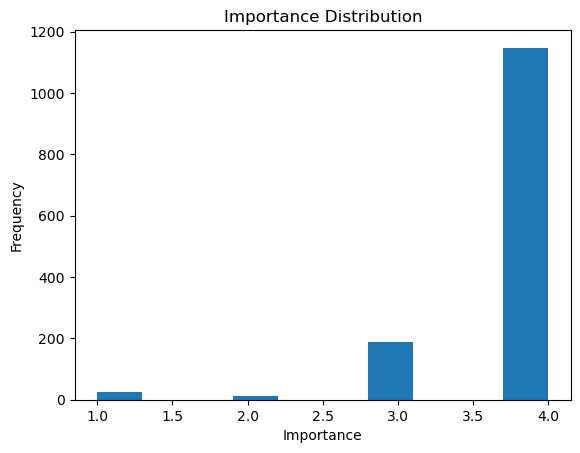

In [14]:

import matplotlib.pyplot as plt

# Plot importance distribution
plt.hist(all_cases['importance'])
plt.xlabel('Importance')
plt.ylabel('Frequency')
plt.title('Importance Distribution')
plt.show()

In [15]:
import pandas as pd

# Get the counts of importance levels
importance_counts = all_cases['importance'].value_counts()

# Print the counts
print(importance_counts)


importance
4    1148
3     189
1      24
2      13
Name: count, dtype: int64


In [123]:
all_cases.columns

Index(['Filename', 'Questions', 'Subject Matter', 'appno', 'source_file',
       'doc_date', 'importance', 'keywords_art_3', 'keywords_art_3_text',
       'Subj_Count', 'new_list_length', 'extracted_apps', 'new_list_length_2'],
      dtype='object')

In [5]:
# Get the counts of importance levels
length_count = len(all_cases[all_cases['new_list_length_2'] > 0])

# Print the counts
print(length_count)

1030


In [71]:
len(all_cases)

1374

In [72]:
interesting = all_cases[all_cases['new_list_length_2'] == 0]

In [73]:
interesting['importance'].value_counts()

importance
4    343
3      1
Name: count, dtype: int64

In [74]:
all_cases_not_in_interesting = all_cases.loc[~all_cases.index.isin(interesting.index)]


In [75]:
all_cases_not_in_interesting['importance'].value_counts()

importance
4    805
3    188
1     24
2     13
Name: count, dtype: int64

In [76]:
all_cases_not_in_interesting.reset_index(inplace=True)

In [77]:
all_cases_not_in_interesting.drop(columns=['index'],inplace=True)

/tmp/ipykernel_24262/4285274856.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_cases_not_in_interesting.drop(columns=['index'],inplace=True)


In [78]:
all_cases_not_in_interesting

,Filename,Questions,Subject Matter,appno,source_file,doc_date,importance,keywords_art_3,keywords_art_3_text,Subj_Count,extracted_apps,new_list_length,new_list_length_2
0,001-109309,1. In the light of the applicants’ claims and ...,"The applicants, M.M., his wife and a minor chi...",72861/11,pruned_ADMISSIBILITY_meta.json,2013-09-03,4,[350],(Art. 3) Prohibition of torture,912,"[30696/09, 57264/09]",2,2
1,001-109387,Has there been a violation of Article 3 of the...,"1. The applicant, Mr Sergiu Buhaniuc, is a Mol...",56074/10,pruned_CHAMBER_meta.json,2014-01-28,4,"[350, 90, 596, 193]","(Art. 3) Prohibition of torture, (Art. 3) Degr...",784,"[27244/95, 26772/95, 33134/03, 18919/10, 25803...",11,7
2,001-109439,1. Taking into account the applicant’s medical...,"The applicant, Mr Telman Akopovich Mkhitaryan,...",46108/11,pruned_CHAMBER_meta.json,2013-02-05,4,"[350, 90, 193]","(Art. 3) Prohibition of torture, (Art. 3) Degr...",3400,"[26772/95, 46468/06, 9852/03, 543/03, 72967/01...",32,20
3,001-109440,1. Did the applicant exhaust domestic remedies...,"The applicant, Mr Nikolay Nikolayevich Ryazano...",44885/06,pruned_ADMISSIBILITYCOM_meta.json,2021-10-19,4,[350],(Art. 3) Prohibition of torture,3957,"[46404/13, 21566/13, 1750/03, 29462/95]",12,4
4,001-109459,1. Did the State authorities have a positive d...,"The applicant, Mrs Irina Trofimovna Smirnova, ...",1870/05,pruned_CHAMBER_meta.json,2016-10-13,3,"[350, 596, 633]","(Art. 3) Prohibition of torture, (Art. 3) Effe...",1814,"[41526/10, 38478/05, 52442/09, 38435/13, 11160...",17,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1025,001-218520,1. Has the applicant been subjected to inhuman...,The application concerns the applicant’s condi...,49439/21,pruned_CHAMBER_meta.json,2023-09-05,3,"[350, 90]","(Art. 3) Prohibition of torture, (Art. 3) Degr...",106,"[7334/13, 49268/10, 21613/16, 42525/07, 23244/16]",15,5
1026,001-219367,1. If the applicant were to be expelled to Syr...,The application concerns the applicant’s pendi...,32891/22,pruned_ADMISSIBILITYCOM_meta.json,2023-08-31,4,[350],(Art. 3) Prohibition of torture,463,[34298/18],3,1
1027,001-221960,1. Were the applicants submitted to treatment ...,The applicants are practising advocates. They ...,51984/17,pruned_COMMITTEE_meta.json,2024-05-16,4,"[350, 596, 90, 193]","(Art. 3) Prohibition of torture, (Art. 3) Effe...",112,"[54217/16, 16483/12, 22978/05, 15741/15, 39630...",7,5
1028,001-223217,1. Were the applicants subjected to treatment ...,"In criminal proceedings against them, the appl...",12542/21;12666/21;42819/21,pruned_ADMISSIBILITYCOM_meta.json,2023-09-14,4,[350],(Art. 3) Prohibition of torture,71,[12542/21],1,1


In [81]:
from sklearn.model_selection import train_test_split

# Split the data into training and test sets
train, test = train_test_split(all_cases_not_in_interesting, test_size=0.8, stratify=all_cases_not_in_interesting['importance'], random_state=42)

In [82]:
train['importance'].value_counts()

importance
4    161
3     38
1      5
2      2
Name: count, dtype: int64

In [83]:
test['importance'].value_counts()

importance
4    644
3    150
1     19
2     11
Name: count, dtype: int64

In [84]:
len(test)

824

In [85]:
new_test = pd.concat([test,interesting])

In [86]:
new_test['importance'].value_counts()

importance
4    987
3    151
1     19
2     11
Name: count, dtype: int64

In [93]:
pd.to_pickle(train,'/users/sgdbareh/volatile/ECHR_Importance/VectorDB/train.pkl')
pd.to_pickle(new_test,'/users/sgdbareh/volatile/ECHR_Importance/VectorDB/test.pkl')

In [94]:
x = pd.read_pickle('/users/sgdbareh/volatile/ECHR_Importance/VectorDB/test.pkl')

In [95]:
x

,Filename,Questions,Subject Matter,appno,source_file,doc_date,importance,keywords_art_3,keywords_art_3_text,Subj_Count,extracted_apps,new_list_length,new_list_length_2
933,001-203620,1. Having regard to the fact that the applican...,The application revolves around an allegation ...,31975/19,pruned_ADMISSIBILITYCOM_meta.json,2023-07-11,4,[350],(Art. 3) Prohibition of torture,73,"[68066/12, 45322/17, 74832/01, 10465/17, 63962...",10,7
244,001-119280,1. Was the applicant subjected to torture or i...,"The applicant, Mr Yuriy Mikhailovich Dolgikh, ...",34697/04,pruned_COMMITTEE_meta.json,2019-07-11,4,"[350, 90]","(Art. 3) Prohibition of torture, (Art. 3) Degr...",3663,"[7334/13, 37240/07, 80529/13, 39908/05, 60042/...",12,9
1025,001-218520,1. Has the applicant been subjected to inhuman...,The application concerns the applicant’s condi...,49439/21,pruned_CHAMBER_meta.json,2023-09-05,3,"[350, 90]","(Art. 3) Prohibition of torture, (Art. 3) Degr...",106,"[7334/13, 49268/10, 21613/16, 42525/07, 23244/16]",15,5
923,001-201485,1. Can the applicant still claim to be a victi...,"The applicant, Ms B.B., is a Polish national w...",67171/17,pruned_ADMISSIBILITY_meta.json,2022-10-18,4,[350],(Art. 3) Prohibition of torture,1438,"[27617/04, 22978/05, 39953/07, 57375/08, 5410/03]",11,5
161,001-114722,1. 1. In light of the applicant’s current stat...,"The applicant, of Kurd origin, arrived in Swit...",65692/12,pruned_CHAMBER_meta.json,2015-04-14,3,"[350, 620]","(Art. 3) Prohibition of torture, (Art. 3) Expu...",919,"[38885/02, 45276/99, 51564/99, 44599/98, 25904...",20,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1369,001-225422,1. Have the applicants been subjected to inhum...,The application concerns the applicant’s ill-t...,54009/21,pruned_ADMISSIBILITYCOM_meta.json,2023-10-12,4,[350],(Art. 3) Prohibition of torture,148,[],0,0
1370,001-225813,1. Has the applicant been subjected to inhuman...,The application concerns an incident that occu...,34039/22,pruned_ADMISSIBILITYCOM_meta.json,2024-02-15,4,[350],(Art. 3) Prohibition of torture,180,[],0,0
1371,001-226519,Was the confinement of the applicant to a rest...,The application concerns the applicant’s confi...,26597/23,pruned_ADMISSIBILITYCOM_meta.json,2024-04-04,4,[350],(Art. 3) Prohibition of torture,90,[],0,0
1372,001-227690,1. Did the material conditions of the applican...,The application concerns the conditions of det...,22144/23,pruned_ADMISSIBILITYCOM_meta.json,2024-04-04,4,[350],(Art. 3) Prohibition of torture,274,[],0,0


### outcome text

In [145]:
pd.read_pickle('/users/sgdbareh/volatile/ECHR_Importance/VectorDB/train.pkl')

,Filename,Questions,Subject Matter,appno,source_file,doc_date,importance,keywords_art_3,keywords_art_3_text,Subj_Count,new_list_length,extracted_apps,new_list_length_2
889,001-194607,1. As regards the alleged violations of Articl...,"1. The facts of the cases, as submitted by the...",55974/16;53118/17;27484/18;28011/19,pruned_CHAMBER_meta.json,2021-12-14,3,"[350, 90, 596, 193, 633]","(Art. 3) Prohibition of torture, (Art. 3) Degr...",4434,31,"[42525/07, 7888/03, 77617/01, 22457/16, 52067/...",24
928,001-202564,1. Were the applicants subjected to treatment ...,A list of the applicants is set out in the app...,44033/17,pruned_CHAMBER_meta.json,2023-07-18,3,"[350, 90, 193]","(Art. 3) Prohibition of torture, (Art. 3) Degr...",1055,39,"[44898/10, 22405/04, 65290/14, 23880/05, 4922/...",16
729,001-172622,1. Has the applicant complied with the six-mon...,"The applicant, Mr Artush Petrosyan, is an Arme...",32427/16,pruned_CHAMBER_meta.json,2021-11-04,3,"[350, 90, 193]","(Art. 3) Prohibition of torture, (Art. 3) Degr...",2148,20,"[61737/14, 10865/09, 24351/94, 55508/07, 798/0...",10
499,001-149050,1. Were the conditions of Mr Magnitskiy’s dete...,1. Application no. 32631/09 was lodged on 11 J...,32631/09;53799/12,pruned_CHAMBER_meta.json,2019-08-27,3,"[350, 90, 596, 193]","(Art. 3) Prohibition of torture, (Art. 3) Degr...",14257,104,"[21056/11, 57671/00, 32631/09, 2763/13, 23939/...",60
801,001-180529,1. The Government are requested to provide the...,"The applicant, Mr Viktor Valeryevich Sukachov,...",14057/17,pruned_CHAMBER_meta.json,2020-01-30,2,"[350, 90]","(Art. 3) Prohibition of torture, (Art. 3) Degr...",3367,97,"[56660/12, 622/11, 21613/16, 29334/11, 44436/0...",73
...,...,...,...,...,...,...,...,...,...,...,...,...,...
303,001-126514,1. (a) Was the applicant subjected to ill-trea...,"The applicant, Mr Mehmet Nuri Tanış, is a Turk...",15442/08,pruned_ADMISSIBILITY_meta.json,2016-02-09,4,[350],(Art. 3) Prohibition of torture,991,20,"[25657/94, 30465/02, 44625/98, 67263/01, 3455/...",14
389,001-142203,1. Has the applicant been subjected to inhuman...,"1. The applicant, Mr Adrian Drăgan, is a state...",65158/09,pruned_CHAMBER_meta.json,2016-02-02,4,"[350, 90, 193]","(Art. 3) Prohibition of torture, (Art. 3) Degr...",1309,24,"[72286/01, 40907/98, 53254/99, 19730/10, 59696...",18
95,001-112186,Has there been a violation of Article 3 of the...,"The applicant, Mr Stanislav Bogdanovici, is a ...",35436/08,pruned_ADMISSIBILITYCOM_meta.json,2013-09-17,4,[350],(Art. 3) Prohibition of torture,388,4,"[15868/07, 26307/95, 53487/99]",3
417,001-145069,As to the admissibility1. Does the applicant c...,"The applicant, Mr Boris Mozer, is a Moldovan n...",11138/10,pruned_GRANDCHAMBER_meta.json,2016-02-23,1,"[350, 90, 193]","(Art. 3) Prohibition of torture, (Art. 3) Degr...",1781,42,"[38281/08, 3242/03, 44917/08, 29392/95, 42973/...",24


### BM25

In [21]:
import pandas as pd
import os
os.chdir('/users/sgdbareh/volatile/ECHR_Importance/VectorDB')
from API_key import openai_key
from openai import OpenAI
client = OpenAI(api_key=openai_key)
import torch 
import faiss
import pickle
from langchain_community.docstore.in_memory import InMemoryDocstore
from langchain_community.vectorstores import FAISS
from langchain_community.vectorstores.utils import DistanceStrategy
from transformers import AutoTokenizer, AutoModel
from langchain.text_splitter import RecursiveCharacterTextSplitter
from langchain_community.document_loaders import DataFrameLoader
from langchain_text_splitters import RecursiveCharacterTextSplitter
from langchain_community.embeddings import OpenAIEmbeddings # Importing OpenAI embeddings from Langchain
from langchain.storage import InMemoryStore
from langchain.retrievers import ParentDocumentRetriever
from langchain_openai import OpenAIEmbeddings
from sklearn.model_selection import ParameterGrid
from initialise_vector_dbs import save_vectors, load_text, load_embeddings
from sentence_transformers import SentenceTransformer, models
from transformers import AutoModel, AutoTokenizer
from langchain_huggingface import HuggingFaceEmbeddings
from langchain_community.retrievers import BM25Retriever



In [28]:
documents = load_text()
    
retriever = BM25Retriever.from_documents(documents,k=500)

with open('bm25_retriever.pkl', 'wb') as f:
    pickle.dump(retriever, f)

print('BM25 retriever saved')

BM25 retriever saved


In [24]:
retriever.invoke('Article 3 concerns the prohibition of torture')

[Document(metadata={'Word Count': 581, 'The Law': 'ALLEGED VIOLATION OF ARTICLE 3 OF THE CONVENTION9. The Court notes that this complaint is not manifestly ill-founded within the meaning of Article 35 § 3 (a) of the Convention or inadmissible on any other grounds. It must therefore be declared admissible.10. The general principles concerning the confinement and living conditions of asylum-seekers have been summarised in Khlaifia and Others v. Italy ([GC], no. 16483/12, §§ 158-69, 15 December 2016).11. In R.R. and Others v. Hungary (no. 36037/17, § 52, 2 March 2021) the Court found a violation of Article 3 with respect to the applicant father who had not been provided with food by the authorities (ibid., § 57). Similarly, in W.O. and Others v. Hungary ([Committee], no. 36896/18, § 13, 25 August 2022) and O.Q. v. Hungary ([Committee], no. 53528/19, § 13, 5 October 2023) the Court found a violation of Article 3 on account of food deprivation for six days.12. As to the situation of the pre

In [26]:
with open('/users/sgdbareh/volatile/ECHR_Importance/VectorDB/bm25_retriever.pkl', 'rb') as f:
    vector_store = pickle.load(f)

In [27]:
vector_store.invoke('Article 3 HELLO')

[Document(metadata={'Word Count': 1154, 'The Law': '17. Following communication, the Government notified the Court that the applicant had been granted asylum in the United Kingdom on 12 July 2013. In light of this development, they asked the Court to strike the application from its list of cases. However, in view of the procedural nature of the questions put to the parties, the applicant did not agree to the strike out and the Court refused the request, preferring to first see the parties’ submissions.18. Nevertheless, in the recent case of M.E. v. Sweden (striking out) [GC], no. 71398/12, 8 April 2015, in which a procedural violation of Article 3 was also alleged, the Court made it clear that, according to its established case-law in cases concerning the expulsion of an applicant from a respondent State, once the applicant no longer risks being expelled from that State, it considers the case to have been resolved and should strike it out of its list of cases, whether or not the applic